In [1]:
from datasets import load_dataset
from huggingface_hub import login
import numpy as np
import os

login(token=os.getenv("HUGGINGFACE_TOKEN_ARNAULT"))

dataset = load_dataset("agomberto/handwritten-ocr-dataset")

images = np.unique([dataset['train'][i]['source_image'] for i in range(len(dataset['train']))])

Generating train split:   0%|          | 0/16467 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/933 [00:00<?, ? examples/s]

In [2]:
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt

def show_example(example):
    # Get the image
    img = example['image']
    
    # Create a high-quality figure
    plt.figure(dpi=150)  # Increased DPI for better quality
    
    # Create a copy of the image for drawing
    img_draw = img.copy()
    draw = ImageDraw.Draw(img_draw)
    
    # Draw the bounding box with thicker line
    bbox = [example['x1'], example['y1'], example['x2'], example['y2']]
    draw.rectangle([bbox[0], bbox[1], bbox[2], bbox[3]], outline='red', width=5)
    
    # Display with improved quality settings
    plt.imshow(img_draw, interpolation='lanczos')  # Better interpolation
    plt.title(f"Text: {example['text']}", fontsize=12, pad=20)
    plt.axis('off')
    
    # Adjust layout to prevent text cutoff
    plt.tight_layout()
    
    # Show with higher quality
    plt.show()

In [6]:
print(len(dataset['train']))

16467


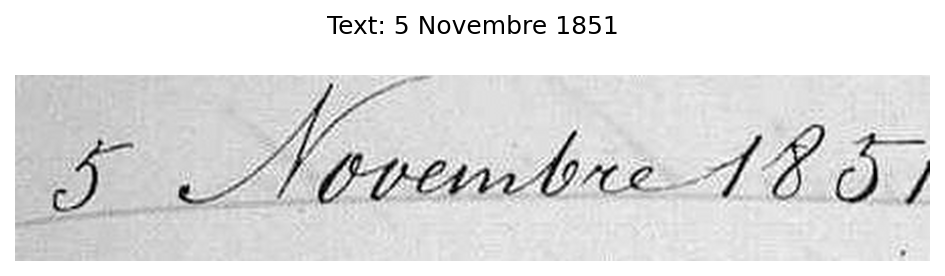

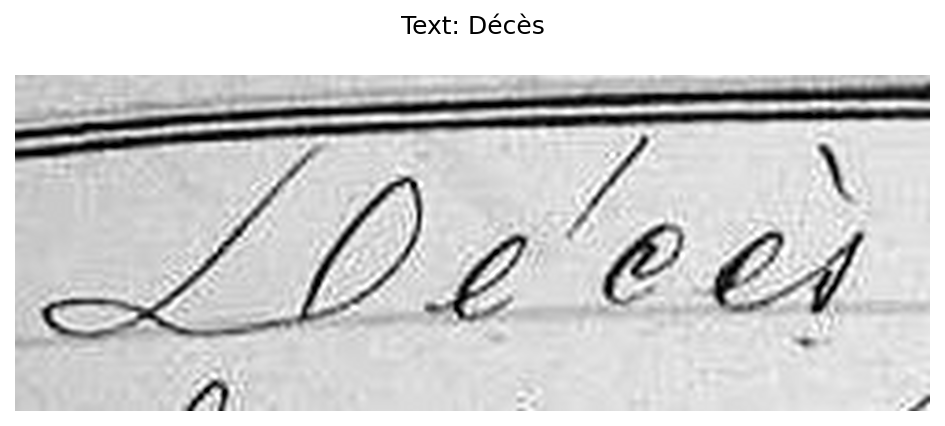

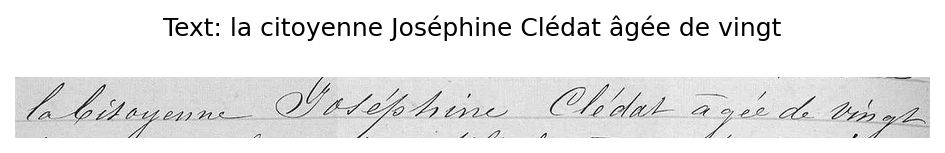

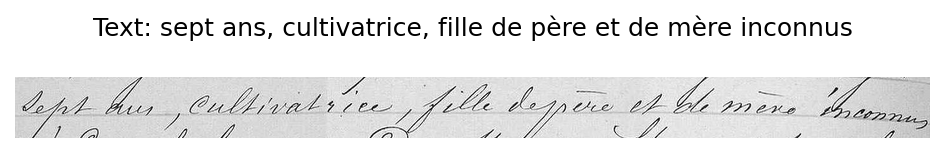

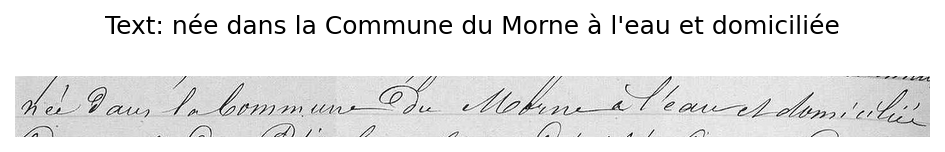

...

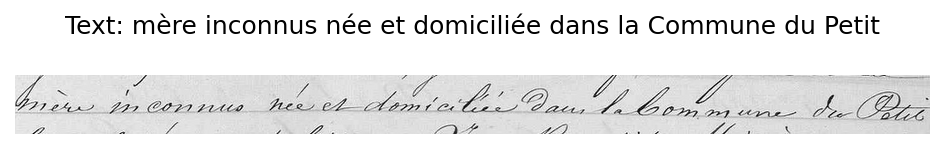

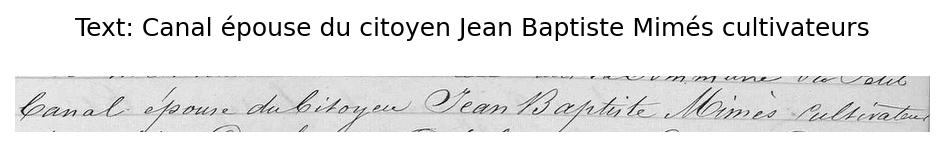

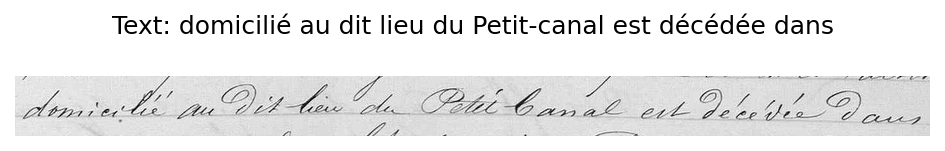

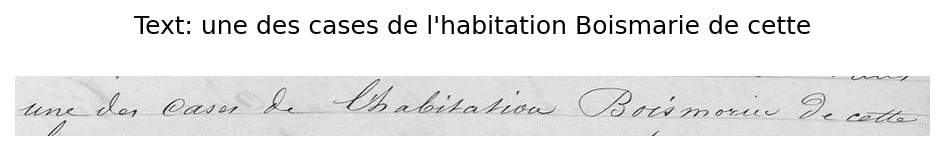

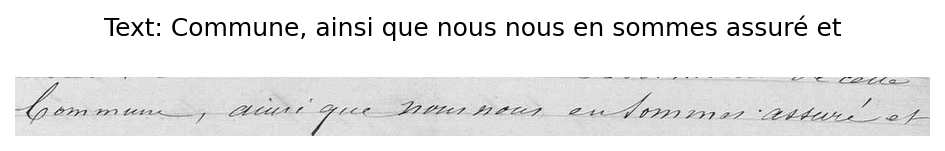

In [3]:
image = np.random.choice(images)

examples = [dataset['train'][i] for i in range(len(dataset['train'])) if dataset['train'][i]['source_image'] == image]

for example in examples:
    show_example(example)